In [1]:
### Load in the data 

In [3]:
import pandas as pd
training_data = pd.read_parquet('training.parquet')
training_data.sample(10)

,Category,Text
14704,sci.electronics,In article <2775@snap> paj@uk.co.gec-mrc (Paul...
9249,talk.politics.misc,"This is as bad as the ""Did You Know"" Japan ba..."
471,talk.politics.mideast,Accounts of Anti-Armenian Human Rights Vi...
17135,soc.religion.christian,In article <Apr.23.02.55.31.1993.3123@geneva.r...
13785,comp.sys.ibm.pc.hardware,I'm considering the purchase of a 486DX-33 VLB...
4994,comp.os.ms-windows.misc,wlieftin@cs.vu.nl (Liefting W) writes:\n: Hell...
11341,comp.windows.x,In <1382.9304261508@zztop.dps.co.uk> gerard@dp...
5562,comp.os.ms-windows.misc,I recently set Windows 3.1 up on my 486DX-33 V...
14423,sci.electronics,In article <1993Apr19.185326.9830@Princeton.ED...
14460,sci.electronics,"I remember, back before commercial mikes with ..."


We want to transform each of the messages into a numeric vector. One way to do this would be to associate a space in a bit vector with every possible word. We could set each bit to `True` or `1` if the corresponding word appears in that message, and `0` or `False` otherwise. In practice this is not practical because of the huge memory requirements. Instead we use a 'hashing vectoriser' which _hashes_ the words to vectors of a fixed, finite number of bits. 

You can see that many of the messages contain non-standard words or character strings such as email addresses. It is common practice to ignore such words during the feature engineering stage. We do this by setting a 'token_pattern' parameter to ensure that only standard words are hashed. 

We also want to remove any 'stop words' from the text. We do this by setting `stop_words='english'`.


In [5]:
from sklearn.feature_extraction.text import HashingVectorizer
BUCKETS=2048

hv = HashingVectorizer(norm=None, token_pattern='(?u)\\b[A-Za-z]\\w+\\b', stop_words ='english', n_features=BUCKETS, alternate_sign = False)
hv
hvcounts = hv.fit_transform(training_data["Text"])
hvcounts

<13947x2048 sparse matrix of type '<class 'numpy.float64'>'
	with 1236563 stored elements in Compressed Sparse Row format>

Let's use term frequency-inverse document frequency, or tf-idf, to generate feature vectors. Tf-idf is commonly used to summarise text data, and it aims to capture how important different words are within a set of documents. Tf-idf combines a normalized word count (or term frequency) with the inverse document frequency (or a measure of how common a word is across all documents) in order to identify words, or terms, which are 'interesting' within the document, with respect to the set of documents. 

In [6]:
from sklearn.feature_extraction.text import TfidfTransformer

tfidf_transformer = TfidfTransformer()
hvdf_tfidf = tfidf_transformer.fit_transform(hvcounts)
hvdf_tfidf

<13947x2048 sparse matrix of type '<class 'numpy.float64'>'
	with 1236563 stored elements in Compressed Sparse Row format>

### Visualise

In [7]:
import sklearn.decomposition

DIMENSIONS = 2

pca2 = sklearn.decomposition.TruncatedSVD(DIMENSIONS)
pca_a = pca2.fit_transform(hvdf_tfidf)

In [8]:
pca_df = pd.DataFrame(pca_a, columns=["x", "y"])
pca_df.sample(10)

,x,y
6786,0.158377,-0.023068
7612,0.221103,-0.078566
8685,0.238993,0.232235
6137,0.236974,-0.058960
1875,0.299240,-0.061253
9869,0.193619,-0.013527
12084,0.213861,-0.033479
10694,0.219901,0.115392
12155,0.254972,-0.023297
5672,0.248710,-0.048666


In [9]:
plot_data = pd.concat([training_data.reset_index(), pca_df], axis=1)

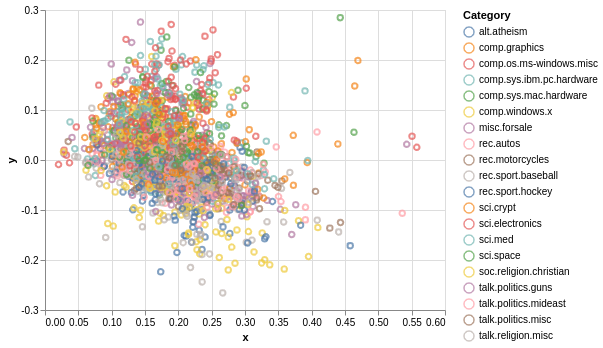

In [10]:
import altair as alt

alt.renderers.enable('notebook')
alt.Chart(plot_data.sample(2000)).encode(x="x", y="y", color="Category").mark_point().interactive()

In [11]:
#No structure. Why?

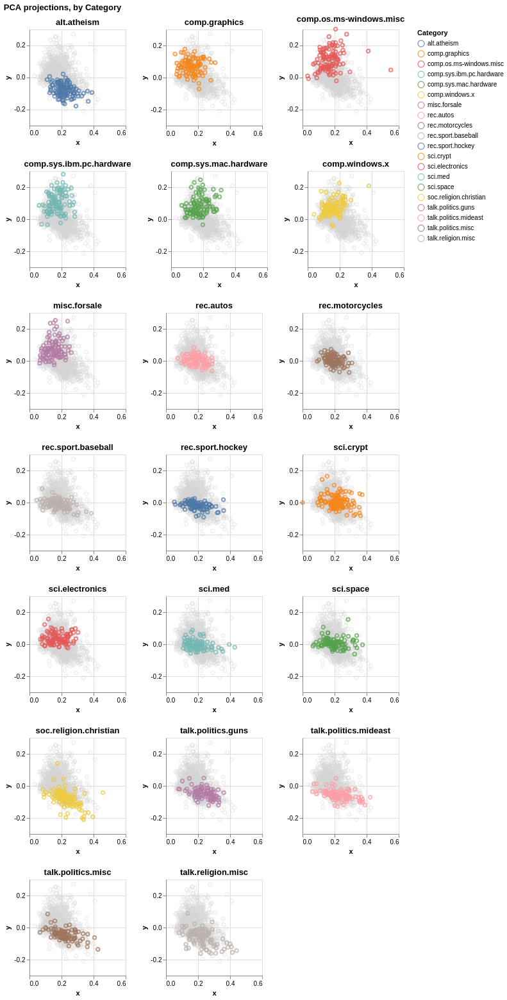

In [12]:
import altair as alt
from altair.expr import datum

data=plot_data.sample(2000)

base = alt.Chart(data).mark_point().encode(
    alt.X('x', scale=alt.Scale(domain=(0, 0.6))),
    alt.Y('y', scale = alt.Scale(domain = (-0.3, 0.3))),
    color='Category:N'
)

## Make gray points for background
chart1 = alt.Chart(data.sample(1000)) \
            .encode(x="x", y="y") \
            .mark_point(opacity=0.3, color="lightgray")


def overlay_make_chart(base_chart, category, options, chart1):
    title = category
    chart2 = base_chart\
      .transform_filter(datum.Category == category)\
      .properties(width=options['width'], 
                    height=options['height'], title=title)
    chart = chart1 + chart2
    return chart


options = {'width': 150, 'height': 150}
charts = [overlay_make_chart(base, category, options, chart1) \
          for category in sorted(data.Category.unique())]

# make a single row
def make_chart_row(row_of_charts):
    hconcat = [chart for chart in row_of_charts]
    row = alt.HConcatChart(hconcat=hconcat)
    return row

# take an array of charts and produce a facet grid
def facet_wrap(charts, charts_per_row):
    rows_of_charts = [
        charts[i:i+charts_per_row] 
        for i in range(0, len(charts), charts_per_row)]        
    vconcat = [make_chart_row(r) for r in rows_of_charts]    
    vcc = alt.VConcatChart(vconcat=vconcat)\
      .configure_axisX(grid=True)\
      .configure_axisY(grid=True)
    return vcc

# assemble the facet grid
compound_chart = facet_wrap(charts, charts_per_row=3)
compound_chart.properties(title='PCA projections, by Category')

In [13]:
##okay good - looks better. 

In [14]:
from sklearn.pipeline import Pipeline 

BUCKETS=2048
hv = HashingVectorizer(norm=None, token_pattern='(?u)\\b[A-Za-z]\\w+\\b', stop_words ='english', n_features=BUCKETS, alternate_sign = False)
tfidf = TfidfTransformer()
feat_pipeline = Pipeline([('vect',hv), ('tfidf',tfidf)])

In [15]:
training_vecs = feat_pipeline.fit_transform(training_data["Text"])

In [18]:
from xgboost import XGBClassifier

In [17]:
pip install xgboost

     |████████████████████████████████| 148.9 MB 27.9 MB/s eta 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [20]:
%%time

XGB_TREE_METHOD='hist'
xgb = XGBClassifier(tree_method=XGB_TREE_METHOD, 
                    # num_parallel_tree=16, 
                    n_estimators=100, 
                    max_depth=3, 
                    colsample_bynode=0.3, 
                    colsample_bytree=0.3, 
                    subsample=1, 
                    reg_alpha=1)

xgb.fit(training_vecs, training_data["Category"])

CPU times: user 13min 3s, sys: 1.11 s, total: 13min 4s
Wall time: 1min 51s


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=0.3, colsample_bytree=0.3, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1,
              objective='multi:softprob', random_state=0, reg_alpha=1,
              reg_lambda=1, scale_pos_weight=None, subsample=1,
              tree_method='hist', validate_parameters=1, verbosity=None)

In [21]:
xgb.score(training_vecs, training_data["Category"])

0.8820534882053488

In [24]:
testing_data = pd.read_parquet('testing.parquet')
testing_vecs=feat_pipeline.transform(testing_data["Text"])
xgb.score(testing_vecs, testing_data["Category"])

0.7204283085159779

In [ ]:
from mlworkflows import plot

df, chart =plot.confusion_matrix(testing_data["Category"], xgb.predict(testing_vecs))

In [ ]:
chart

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(testing_data["Category"], xgb.predict(testing_vecs)))

In [ ]:
from mlworkflows import util

util.serialize_to(xgb, "model.sav")

In [ ]:
pip install cloudpickle

In [ ]:
from mlworkflows import util

util.serialize_to(xgb, "model.sav")